In [ ]:
"""
Brief overview of the training:-
Upto 12th epoch, 128*128 images are produced. From the 13th to 25th epoch, the blending mechanism
works and the generator starts producing 256*256 images.
The model does not completely rely on the levelUp layer after the completion of the blending
mechanism(just 85%). 
The discriminator is also trained for the classification task. In the testing script, the generator
generates images and the discriminator classifies the generated images into respective classes.
Mixed precision training is used which helped in reducing the training time without any observable
effect on the performance. It also prevented the cuda out of memory error.  
"""

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import transforms , datasets
from torch.utils.data import DataLoader
from torch.amp import autocast , GradScaler
import torchvision
import matplotlib.pyplot as plt

In [2]:
import kagglehub
path = kagglehub.dataset_download("lamsimon/celebahq")
print("Path to dataset files:", path)

100%|██████████| 2.55G/2.55G [02:20<00:00, 19.5MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/lamsimon/celebahq/versions/1


In [3]:
import os
train_dir = os.path.join(path , 'celeba_hq' , 'train')
def data_loader(image_dim):
    transform = transforms.Compose([
    transforms.Resize((image_dim,image_dim)),
    transforms.ToTensor(),
    transforms.Normalize((0.5,0.5,0.5),(0.5,0.5,0.5))
])
    data = datasets.ImageFolder(train_dir , transform)
    loader = DataLoader(data , batch_size=64 ,num_workers=2 , shuffle=True)
    return loader

In [5]:
noise_size = 100
lr = 0.0002
num_epochs = 35
level_up_threshold = 13
alpha = 0
loss_fn = nn.BCEWithLogitsLoss()
classification_loss_fn = nn.CrossEntropyLoss()
scaler = GradScaler()

In [4]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Device : {device}")

Device : cuda


In [10]:
def convTransposeBlock(in_channels , out_channels):
    return nn.Sequential(
        nn.ConvTranspose2d(in_channels , out_channels , 4 , 2 , 1),
        nn.BatchNorm2d(out_channels),
        nn.ReLU()
    )
def convBlock(in_channels , out_channels , k , s , p):
    return nn.Sequential(
        nn.Conv2d(in_channels , out_channels , k , s , p),
    )
def disConvBlock(in_channels , out_channels):
    return nn.Sequential(
        nn.Conv2d(in_channels, out_channels , 4 , 2 , 1),
        nn.BatchNorm2d(out_channels),
        nn.LeakyReLU(0.2),
    )


In [6]:
class Generator(nn.Module):
    def __init__(self , noise_size=100 , channels=128 , out_channels = 3):
        super(Generator , self).__init__()
        self.initial = nn.Sequential (
            nn.Linear(  noise_size , (channels*8) *4*4 ),
            nn.Dropout(0.1),
            nn.ReLU()
        )
        self.generator1 = nn.Sequential(
            convTransposeBlock(channels*8 , channels*4),       # (1024,4,4)  ------>  (512,8,8)
            convTransposeBlock(channels*4 , channels*2),       # (512,8,8)  ------>  (256,16,16)
            convTransposeBlock(channels*2 , channels*2),       # (256,16,16)  ---->  (256,32,32)
            convTransposeBlock(channels*2 , channels*1),       # (256,32,32)  ---->  (128,64,64)
            convTransposeBlock(channels*1 , channels*1),       # (128,64,64)  ---->  (128,128,128)

        )
        self.levelUp = nn.Sequential(
            convTransposeBlock(channels*1 , channels*1),       # (128,128,128)  -->  (128,256,256)
        )
        self.toRGB = nn.Sequential(
            convBlock(channels*1 , out_channels , 1 , 1 , 0)   # dim remains same
        )
        self.tanh = nn.Tanh()


    def forward(self , noise , epoch , alpha):
         x = self.initial(noise)
         x = x.view(-1 , 128*8 , 4 , 4 )

         if epoch+1 >= level_up_threshold:
               images_128dim_128c = self.generator1(x)
               images_256dim_128c = self.levelUp(images_128dim_128c)
               images = alpha*(self.toRGB(images_256dim_128c)) + (1-alpha)*(self.toRGB(F.interpolate(images_128dim_128c,scale_factor=2, mode='nearest')))
         else:
              images_128dim_128c = self.generator1(x)
              images = self.toRGB(images_128dim_128c)

         return self.tanh(images)

In [7]:
class Discriminator(nn.Module):
    def __init__(self , input_channels = 3 , channels=8 , num_classes=2):
        super(Discriminator , self).__init__()

        self.fromRGB =  nn.Sequential(
          convBlock(input_channels , channels , 1 , 1 , 0),      ##dim remains same
          nn.LeakyReLU(0.2)
        )
        self.avgPool = nn.AvgPool2d(2,2)
        self.levelUp = nn.Sequential(
          disConvBlock(channels*1,channels*1),        # (8,256,256)  ----->  (8,128,128)
        )

        self.discriminator = nn.Sequential(
          disConvBlock(channels*1,channels*2),        # (8,128,128)  ----->  (16,64,64)
          disConvBlock(channels*2,channels*4),        # (16,64,64)  ---->  (32,32,32)
          disConvBlock(channels*4,channels*8),        # (32,32,32)  ------>  (64,16,16)
        )
        self.fc1 = nn.Linear(64*16*16 , 512)
        self.batchNorm = nn.BatchNorm1d(512)
        self.leakyrelu = nn.LeakyReLU(0.2)
        self.fc2 = nn.Linear(512 , 1)
        self.classifyingLayer = nn.Linear(512 , num_classes)
        self.dropout = nn.Dropout(p=0.3)
        self.relu = nn.ReLU()


    def forward(self , images , epoch , alpha , classification=False):

        if epoch+1 >=level_up_threshold:
             images_128dim_8c = self.levelUp(self.fromRGB(images))
             images_128dim_8c = alpha*(images_128dim_8c) + (1-alpha)*(self.avgPool(self.fromRGB(images)))
        else:
             images_128dim_8c = self.fromRGB(images)

        images = self.discriminator(images_128dim_8c)
        images = images.view(images.size(0) , -1)
        images_flattened = self.fc1(images)
        probability = self.fc2(self.leakyrelu(self.batchNorm(images_flattened)))

        if classification:
              class_probabilities = self.classifyingLayer(self.dropout(self.relu(images_flattened)))
              return probability.squeeze() , class_probabilities

        else: return probability.squeeze()



In [8]:
def weight_initialisation(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, mean=0.0, std=0.02)     
        nn.init.zeros_(m.bias.data)
    elif classname.find('BatchNorm2d') != -1:
        nn.init.normal_(m.weight.data, mean=1.0, std=0.02)
        nn.init.zeros_(m.bias.data)
    elif classname.find('BatchNorm1d') != -1:
        nn.init.normal_(m.weight.data, mean=1.0, std=0.02)
        nn.init.zeros_(m.bias.data)
    elif classname.find('Linear') != -1:
        nn.init.normal_(m.weight.data, mean=0.0, std=0.02)
        nn.init.zeros_(m.bias.data)

In [11]:
discriminator = Discriminator().to(device)
discriminator.apply(weight_initialisation)
optimizer_dis = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))

generator = Generator().to(device)
generator.apply(weight_initialisation)
optimizer_gen = torch.optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))

35
For epoch 1/35 , for step 438/438 -- disc loss:- 0.7446  , gen loss:- 1.6276
For epoch 1/35 ,Generator Accuracy: 5.5786 ,Discriminator Classifying Accuracy: 91.2643


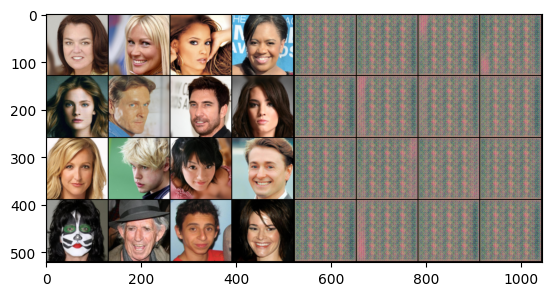

Saved model checkpoint at : 1th_epoch.pth
For epoch 2/35 , for step 438/438 -- disc loss:- 0.5364  , gen loss:- 1.2094
For epoch 2/35 ,Generator Accuracy: 7.7857 ,Discriminator Classifying Accuracy: 93.6036


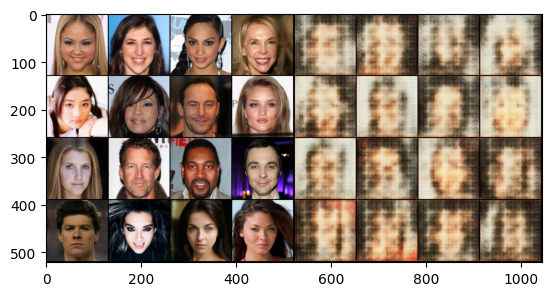

For epoch 3/35 , for step 438/438 -- disc loss:- 0.5869  , gen loss:- 1.0626
For epoch 3/35 ,Generator Accuracy: 14.6857 ,Discriminator Classifying Accuracy: 94.9536


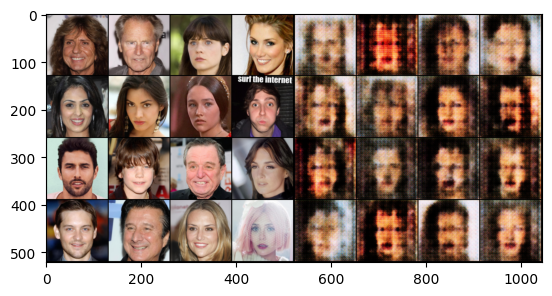

For epoch 4/35 , for step 438/438 -- disc loss:- 0.7032  , gen loss:- 0.8699
For epoch 4/35 ,Generator Accuracy: 15.0393 ,Discriminator Classifying Accuracy: 95.7107


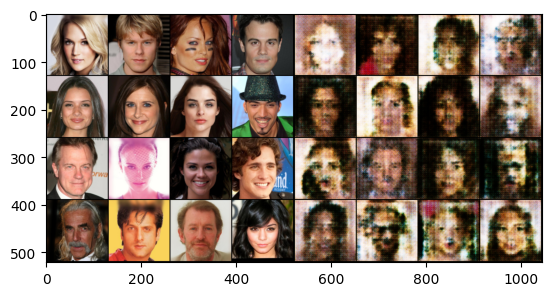

For epoch 5/35 , for step 438/438 -- disc loss:- 0.5686  , gen loss:- 0.8995
For epoch 5/35 ,Generator Accuracy: 14.4000 ,Discriminator Classifying Accuracy: 96.5464


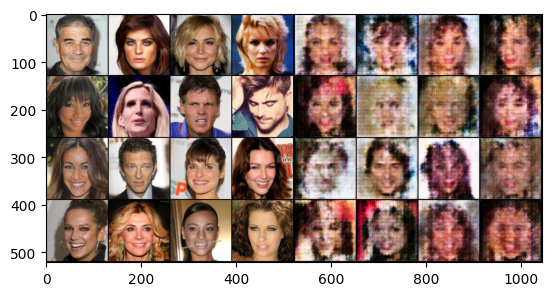

For epoch 6/35 , for step 438/438 -- disc loss:- 0.6158  , gen loss:- 0.9796
For epoch 6/35 ,Generator Accuracy: 13.8000 ,Discriminator Classifying Accuracy: 96.8107


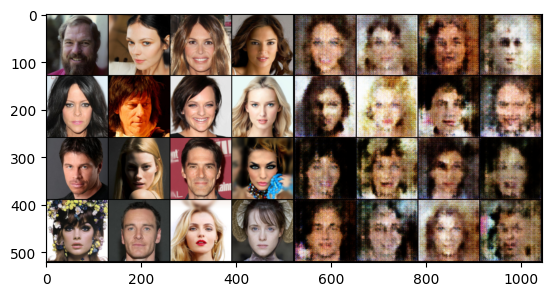

For epoch 7/35 , for step 438/438 -- disc loss:- 0.5992  , gen loss:- 0.8369
For epoch 7/35 ,Generator Accuracy: 13.9500 ,Discriminator Classifying Accuracy: 97.2679


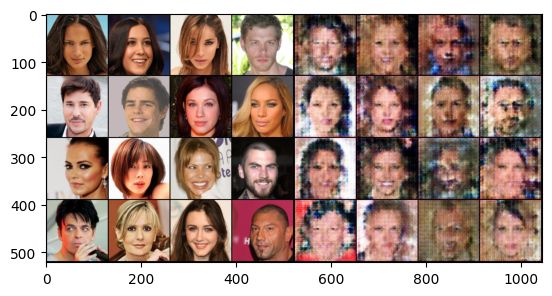

For epoch 8/35 , for step 438/438 -- disc loss:- 0.6075  , gen loss:- 0.9521
For epoch 8/35 ,Generator Accuracy: 14.5536 ,Discriminator Classifying Accuracy: 97.5500


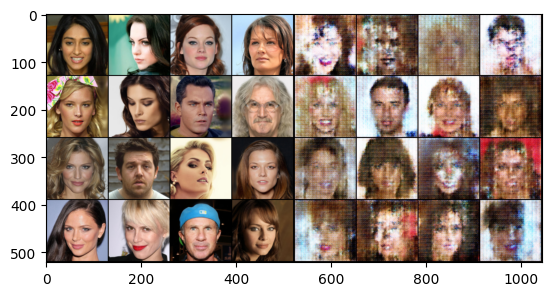

For epoch 9/35 , for step 438/438 -- disc loss:- 0.5855  , gen loss:- 0.8712
For epoch 9/35 ,Generator Accuracy: 14.4821 ,Discriminator Classifying Accuracy: 98.0893


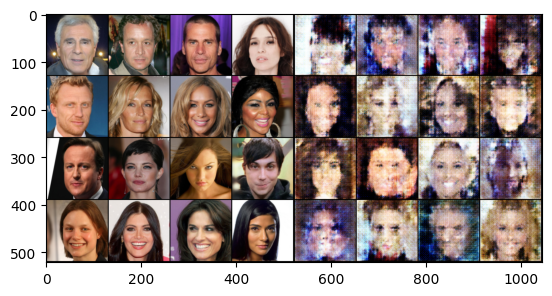

For epoch 10/35 , for step 438/438 -- disc loss:- 0.5822  , gen loss:- 0.8488
For epoch 10/35 ,Generator Accuracy: 15.3571 ,Discriminator Classifying Accuracy: 98.1893


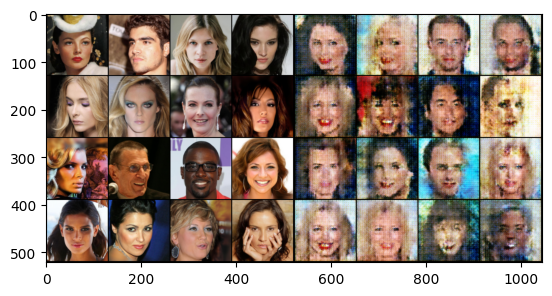

For epoch 11/35 , for step 438/438 -- disc loss:- 0.6378  , gen loss:- 0.8600
For epoch 11/35 ,Generator Accuracy: 15.6000 ,Discriminator Classifying Accuracy: 98.6786


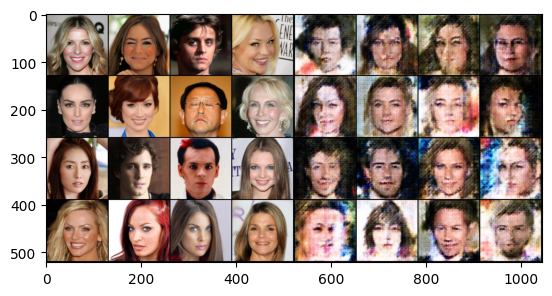

For epoch 12/35 , for step 438/438 -- disc loss:- 0.5621  , gen loss:- 0.8811
For epoch 12/35 ,Generator Accuracy: 14.9321 ,Discriminator Classifying Accuracy: 98.7536


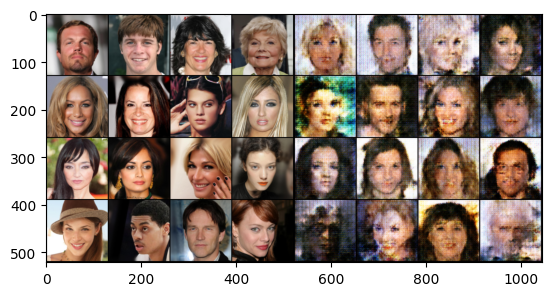

For epoch 13/35 , for step 438/438 -- disc loss:- 0.5821  , gen loss:- 0.8493
For epoch 13/35 ,Generator Accuracy: 21.3107 ,Discriminator Classifying Accuracy: 97.4679


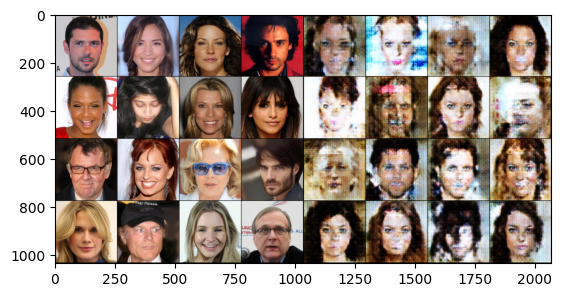

For epoch 14/35 , for step 438/438 -- disc loss:- 0.6134  , gen loss:- 1.0891
For epoch 14/35 ,Generator Accuracy: 15.2143 ,Discriminator Classifying Accuracy: 98.8714


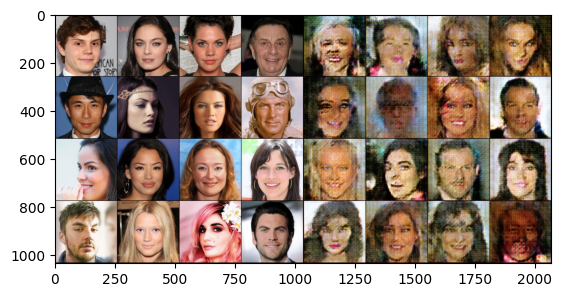

For epoch 15/35 , for step 438/438 -- disc loss:- 0.6342  , gen loss:- 1.0883
For epoch 15/35 ,Generator Accuracy: 16.3607 ,Discriminator Classifying Accuracy: 99.1393


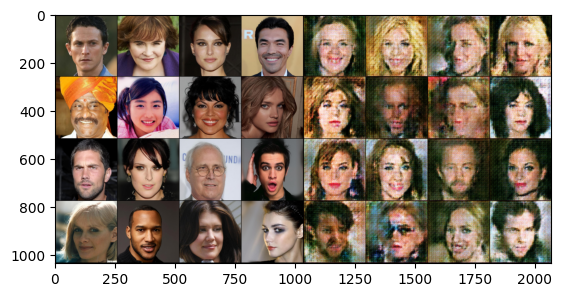

For epoch 16/35 , for step 438/438 -- disc loss:- 0.6286  , gen loss:- 0.9644
For epoch 16/35 ,Generator Accuracy: 15.1071 ,Discriminator Classifying Accuracy: 99.2893


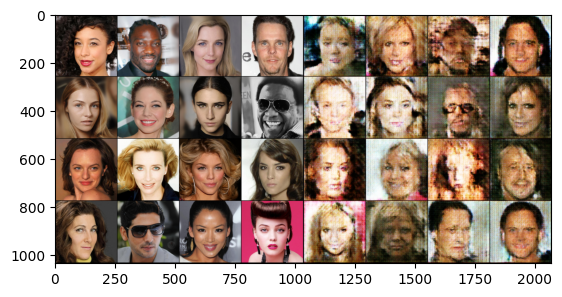

For epoch 17/35 , for step 438/438 -- disc loss:- 0.5631  , gen loss:- 1.2134
For epoch 17/35 ,Generator Accuracy: 14.4036 ,Discriminator Classifying Accuracy: 99.3071


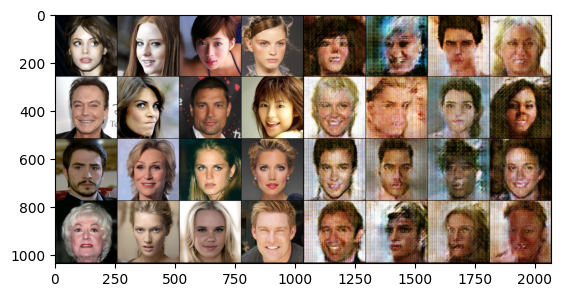

For epoch 18/35 , for step 438/438 -- disc loss:- 0.5061  , gen loss:- 1.0465
For epoch 18/35 ,Generator Accuracy: 15.1500 ,Discriminator Classifying Accuracy: 99.4214


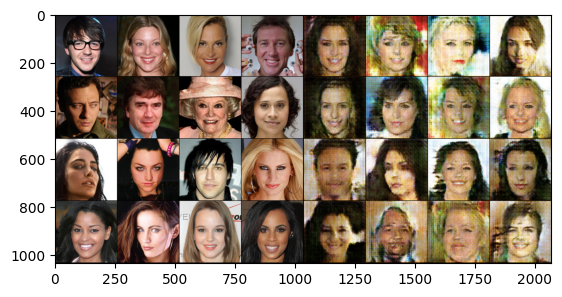

For epoch 19/35 , for step 438/438 -- disc loss:- 0.6030  , gen loss:- 0.9928
For epoch 19/35 ,Generator Accuracy: 16.1714 ,Discriminator Classifying Accuracy: 99.4857


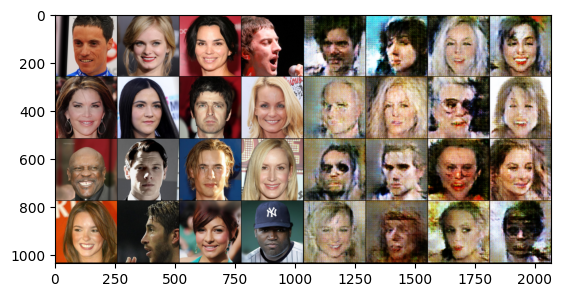

For epoch 20/35 , for step 438/438 -- disc loss:- 0.5859  , gen loss:- 1.0962
For epoch 20/35 ,Generator Accuracy: 15.7036 ,Discriminator Classifying Accuracy: 99.5286


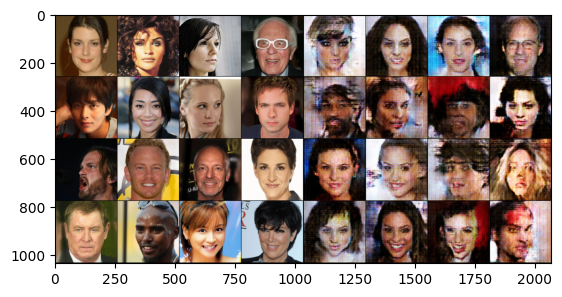

Saved model checkpoint at : 20th_epoch.pth
For epoch 21/35 , for step 438/438 -- disc loss:- 0.5578  , gen loss:- 1.0307
For epoch 21/35 ,Generator Accuracy: 16.5679 ,Discriminator Classifying Accuracy: 99.5893


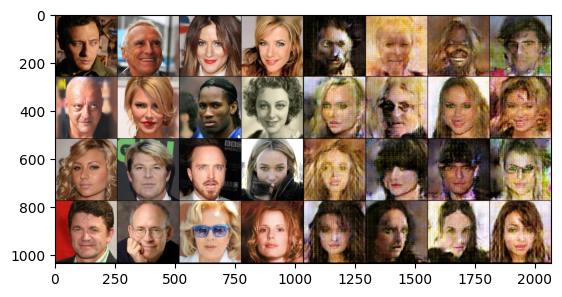

For epoch 22/35 , for step 438/438 -- disc loss:- 0.5317  , gen loss:- 1.2541
For epoch 22/35 ,Generator Accuracy: 15.5143 ,Discriminator Classifying Accuracy: 99.6357


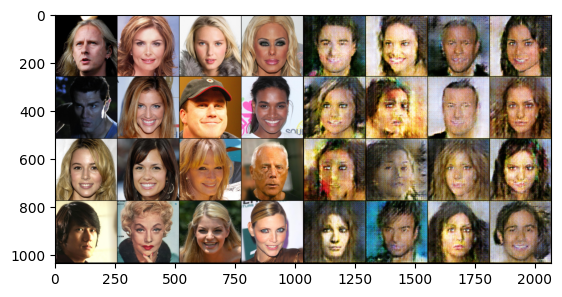

Saved model checkpoint at : 22th_epoch.pth
For epoch 23/35 , for step 438/438 -- disc loss:- 0.6520  , gen loss:- 1.2334
For epoch 23/35 ,Generator Accuracy: 14.7893 ,Discriminator Classifying Accuracy: 99.6893


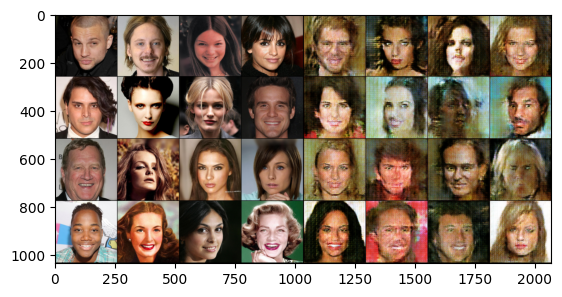

For epoch 24/35 , for step 438/438 -- disc loss:- 0.5697  , gen loss:- 1.2079
For epoch 24/35 ,Generator Accuracy: 14.8750 ,Discriminator Classifying Accuracy: 99.6964


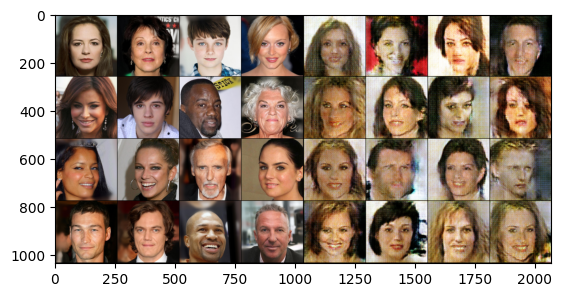

Saved model checkpoint at : 24th_epoch.pth
For epoch 25/35 , for step 438/438 -- disc loss:- 0.5777  , gen loss:- 1.2847
For epoch 25/35 ,Generator Accuracy: 15.5714 ,Discriminator Classifying Accuracy: 99.6607


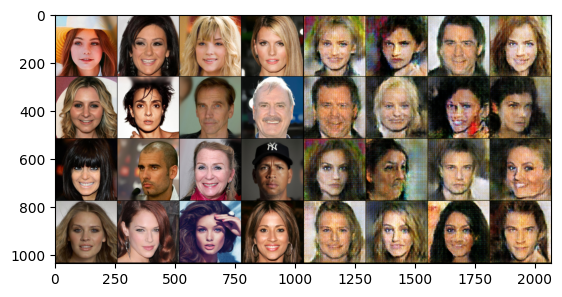

For epoch 26/35 , for step 438/438 -- disc loss:- 0.5206  , gen loss:- 1.2095
For epoch 26/35 ,Generator Accuracy: 14.6250 ,Discriminator Classifying Accuracy: 99.7357


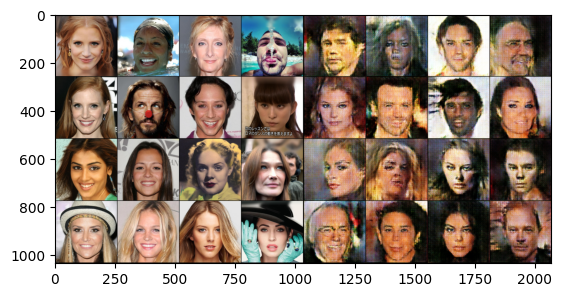

Saved model checkpoint at : 26th_epoch.pth
For epoch 27/35 , for step 438/438 -- disc loss:- 0.5277  , gen loss:- 1.2605
For epoch 27/35 ,Generator Accuracy: 15.1821 ,Discriminator Classifying Accuracy: 99.7321


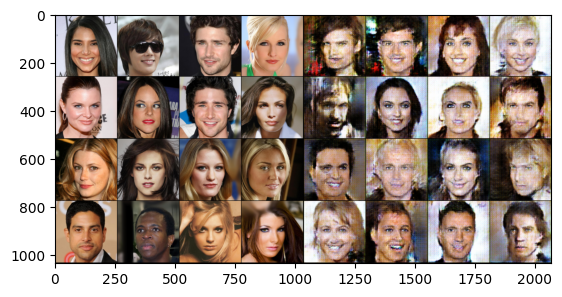

For epoch 28/35 , for step 438/438 -- disc loss:- 0.5313  , gen loss:- 1.2706
For epoch 28/35 ,Generator Accuracy: 14.1536 ,Discriminator Classifying Accuracy: 99.7429


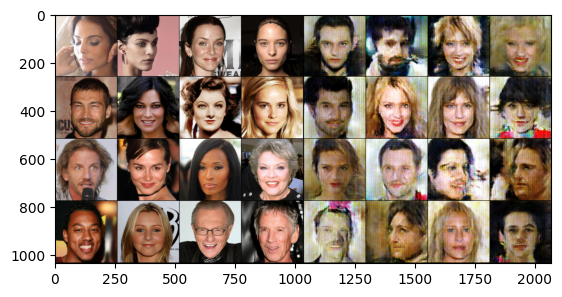

Saved model checkpoint at : 28th_epoch.pth
For epoch 29/35 , for step 438/438 -- disc loss:- 0.5405  , gen loss:- 1.2465
For epoch 29/35 ,Generator Accuracy: 13.9036 ,Discriminator Classifying Accuracy: 99.7750


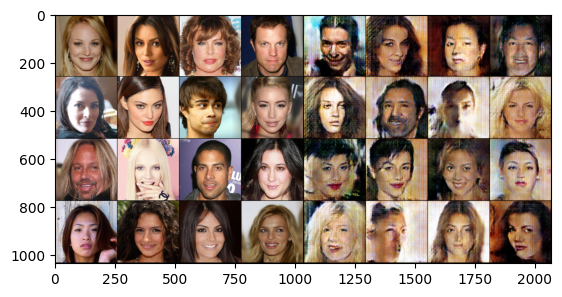

For epoch 30/35 , for step 438/438 -- disc loss:- 0.6102  , gen loss:- 1.2559
For epoch 30/35 ,Generator Accuracy: 14.3036 ,Discriminator Classifying Accuracy: 99.7964


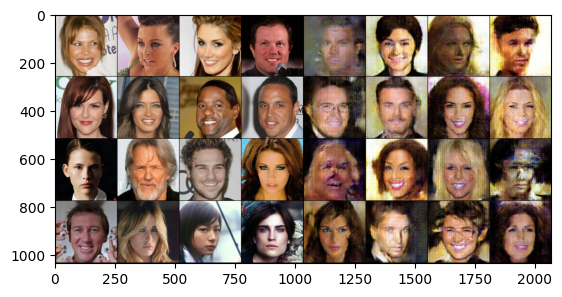

Saved model checkpoint at : 30th_epoch.pth
For epoch 31/35 , for step 438/438 -- disc loss:- 0.5888  , gen loss:- 1.1912
For epoch 31/35 ,Generator Accuracy: 14.4821 ,Discriminator Classifying Accuracy: 99.7750


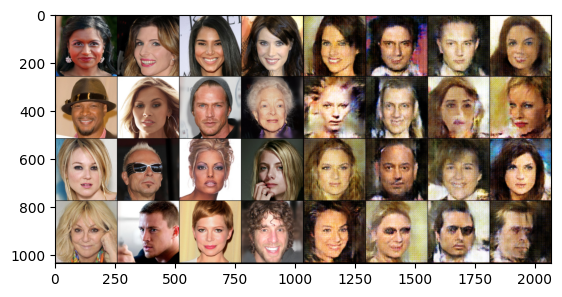

For epoch 32/35 , for step 438/438 -- disc loss:- 0.5241  , gen loss:- 1.3124
For epoch 32/35 ,Generator Accuracy: 13.7571 ,Discriminator Classifying Accuracy: 99.8143


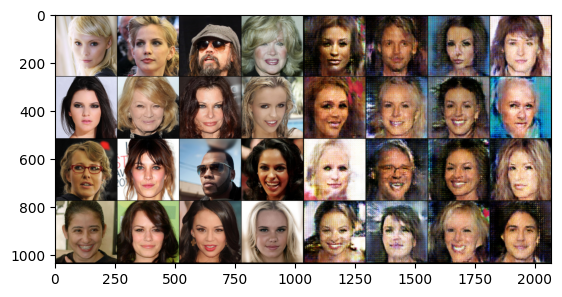

Saved model checkpoint at : 32th_epoch.pth
For epoch 33/35 , for step 438/438 -- disc loss:- 0.4792  , gen loss:- 1.3667
For epoch 33/35 ,Generator Accuracy: 14.1500 ,Discriminator Classifying Accuracy: 99.8107


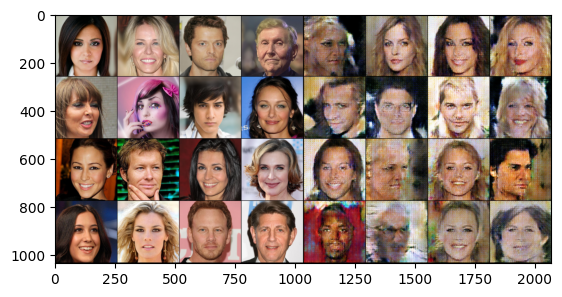

For epoch 34/35 , for step 438/438 -- disc loss:- 0.5308  , gen loss:- 1.1060
For epoch 34/35 ,Generator Accuracy: 14.3464 ,Discriminator Classifying Accuracy: 99.8036


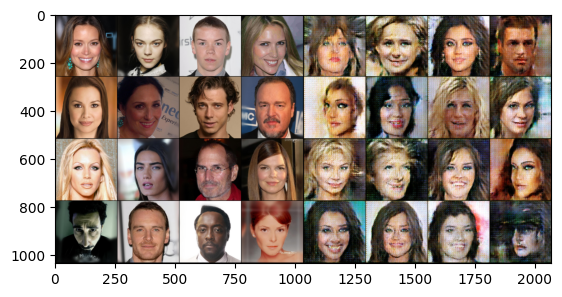

Saved model checkpoint at : 34th_epoch.pth
For epoch 35/35 , for step 438/438 -- disc loss:- 0.5434  , gen loss:- 1.1652
For epoch 35/35 ,Generator Accuracy: 12.5393 ,Discriminator Classifying Accuracy: 99.8000


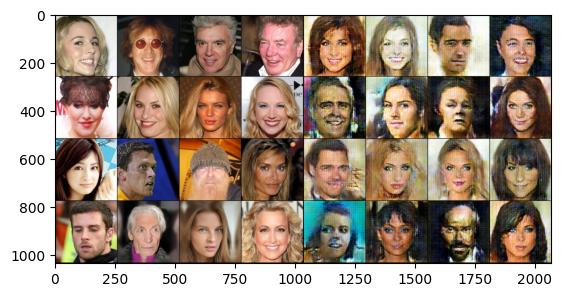

Saved model checkpoint at : 35th_epoch.pth


In [13]:
print(num_epochs)
def disc_loss(batch_size , real_images , class_labels , epoch):
    smoothing = 0.05
    with autocast('cuda'):
                (dis_real , class_probs ) = discriminator(real_images , epoch , alpha , True)
                real_loss = loss_fn(dis_real, torch.full_like(dis_real, 1.0 - smoothing))
                noise = torch.randn(batch_size, noise_size).to(device)
                fake_images = generator(noise , epoch , alpha)
                dis_fake  = discriminator(fake_images.detach() , epoch , alpha)
                fake_loss = loss_fn(dis_fake, torch.full_like(dis_real, smoothing))
                classification_loss = classification_loss_fn(class_probs , class_labels)
    return (0.5*fake_loss + 0.4*real_loss + 0.1*classification_loss)  , class_probs

def generator_loss(batch_size , epoch ):
    with autocast('cuda'):
            noise = torch.randn(batch_size ,noise_size).to(device)
            fake_images = generator(noise , epoch , alpha)
            outputs = discriminator(fake_images , epoch , alpha)
            gen_loss = loss_fn(outputs, torch.ones_like(outputs))
    return gen_loss , outputs

def wt_updation(loss , optimizer):
    optimizer.zero_grad()
    scaler.scale(loss).backward()
    scaler.step(optimizer)
    scaler.update()

for epoch in range(num_epochs):
    generator.train()
    discriminator.train()
    correct_predictions = 0
    total_predictions = 0
    total_fake_classified_as_real = 0
    total_fake_images = 0

    if epoch+1 == 1: train_loader = data_loader(128)
    if epoch+1 == level_up_threshold: train_loader=data_loader(256)
    if epoch+1 >= level_up_threshold and epoch+1 < level_up_threshold+13: alpha = alpha + (1/15)
         
    for i , (real_images , class_labels) in enumerate(train_loader):
        real_images ,class_labels = real_images.to(device) , class_labels.to(device)
        batch_size = real_images.size(0)

         
        (dis_loss , class_probs) = disc_loss(batch_size , real_images , class_labels , epoch )
        wt_updation(dis_loss , optimizer_dis)
        _ , predictions = torch.max(class_probs , 1)
        correct_predictions += (predictions == class_labels).sum().item()
        total_predictions += class_labels.size(0)

        (gen_loss , outputs ) = generator_loss(batch_size , epoch)
        wt_updation(gen_loss , optimizer_gen)
        pred_fake_as_real = (torch.sigmoid(outputs) >= 0.5).sum().item()
        total_fake_classified_as_real += pred_fake_as_real
        total_fake_images += batch_size


    print(f"For epoch {epoch+1}/{num_epochs} , for step {len(train_loader)}/{len(train_loader)} -- disc loss:- {dis_loss:.4f}  , gen loss:- {gen_loss:.4f}")
    gen_accu = total_fake_classified_as_real / total_fake_images * 100
    dis_accu = correct_predictions/total_predictions * 100
    print(f"For epoch {epoch+1}/{num_epochs} ,Generator Accuracy: {gen_accu:.4f} ,Discriminator Classifying Accuracy: {dis_accu:.4f}")

    if (epoch + 1) % 1 == 0:
         with torch.no_grad():
            generator.eval()
            discriminator.eval()
            real_images = real_images * 0.5 + 0.5
            grid_real = torchvision.utils.make_grid((real_images.cpu())[:16], nrow=4).permute(1, 2, 0)
            z = torch.randn(16 ,noise_size).to(device)
            fake_images = (generator(z , epoch , alpha).cpu())[:16]
            fake_images = fake_images * 0.5 + 0.5
            grid_fake = torchvision.utils.make_grid(fake_images, nrow=4).permute(1, 2, 0)
            grids = torch.cat((grid_real, grid_fake), dim=1)
            plt.imshow(grids)
            plt.show()

    if (epoch+1) in [1, 20 , 22 , 24 , 26 , 28 , 30 , 32 ,34 , 35]:
            checkpoint_path = f"{epoch + 1}th_epoch.pth"
            torch.save({
                'epoch': epoch + 1,
                'gen_state_dict': generator.state_dict(),
                'disc_state_dict': discriminator.state_dict(),
                'alpha': alpha,
                'generator_accuracy': gen_accu,
                'discriminator_classification_accuracy': dis_accu,

            }, checkpoint_path)
            print(f"Saved model checkpoint at : {checkpoint_path}")
